In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
pd.options.display.max_columns=None
from sklearn.preprocessing import StandardScaler
from scipy.stats import trim_mean
import statistics as st
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats import weightstats
import statistics
import random
import warnings
warnings.filterwarnings('ignore')

In [3]:
test = pd.read_csv('/kaggle/input/predicting-lead-concentration-in-the-united-states/test.csv')
test.head()

,ID,Longitude,Latitude,Date
0,1,-86.585003,34.728831,1980-08-07
1,2,-86.585003,34.728831,1980-09-24
2,3,-86.585003,34.728831,1980-10-30
3,4,-86.585003,34.728831,1980-12-17
4,5,-85.978974,31.790479,1980-01-10


In [4]:
train = pd.read_csv('/kaggle/input/predicting-lead-concentration-in-the-united-states/train.csv')
train.head()

,ID,Longitude,Latitude,Date,Value
0,1,-87.531711,41.697813,1984-08-22,0.270
1,2,-75.759167,40.476667,2000-02-12,0.030
2,3,-81.036248,34.024497,1995-06-20,0.005
3,4,-95.843642,34.829396,2012-09-06,0.002
4,5,-86.184710,39.775876,1986-09-11,0.117


In [5]:
combined = pd.concat([train,test])
combined.head()

,ID,Longitude,Latitude,Date,Value
0,1,-87.531711,41.697813,1984-08-22,0.270
1,2,-75.759167,40.476667,2000-02-12,0.030
2,3,-81.036248,34.024497,1995-06-20,0.005
3,4,-95.843642,34.829396,2012-09-06,0.002
4,5,-86.184710,39.775876,1986-09-11,0.117


In [5]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 879854 entries, 0 to 175970
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   ID         879854 non-null  int64  
 1   Longitude  879854 non-null  float64
 2   Latitude   879854 non-null  float64
 3   Date       879854 non-null  object 
 4   Value      703883 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 40.3+ MB


In [6]:
combined.dtypes

ID             int64
Longitude    float64
Latitude     float64
Date          object
Value        float64
dtype: object

In [7]:
combined.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,879854.0,439927.500000,253992.116211,1.000,219964.250000,439927.50000,659890.750000,879854.0000
Longitude,879854.0,-91.974150,14.794403,-162.968,-96.873056,-90.10155,-81.024141,0.0000
Latitude,879854.0,37.644539,4.803088,0.000,34.026370,38.26351,40.639509,67.5701
Value,703883.0,0.235287,1.127056,-0.007,0.008200,0.04000,0.150000,147.9000


In [8]:
combined.isnull().sum()/len(combined)*100

ID            0.000000
Longitude     0.000000
Latitude      0.000000
Date          0.000000
Value        20.000023
dtype: float64

In [9]:
combined.shape

(879854, 5)

In [10]:
Q1 = combined.quantile(0.25)
Q2 = combined.quantile(0.5)
Q3 = combined.quantile(0.75)
IQR=Q3-Q1
print(IQR)

/tmp/ipykernel_32/2240195514.py:1: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = combined.quantile(0.25)
/tmp/ipykernel_32/2240195514.py:2: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q2 = combined.quantile(0.5)
/tmp/ipykernel_32/2240195514.py:3: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = combined.quantile(0.75)


ID           439926.500000
Longitude        15.848915
Latitude          6.613139
Value             0.141800
dtype: float64


In [11]:
UL = Q3+(1.5*IQR)
LL= Q1-(1.5*IQR)

In [12]:
combined_new = combined[~((combined>UL)|(combined<LL)).any(axis=1)]

/tmp/ipykernel_32/1551434999.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  combined_new = combined[~((combined>UL)|(combined<LL)).any(axis=1)]


In [13]:
combined_new.shape

(750533, 5)

In [14]:
combined.skew()

/tmp/ipykernel_32/3158812268.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  combined.skew()


ID          -4.545798e-18
Longitude   -9.797721e-01
Latitude    -4.294026e-01
Value        3.025255e+01
dtype: float64

In [15]:
combined.kurt()

/tmp/ipykernel_32/292944781.py:1: FutureWarning: The default value of numeric_only in DataFrame.kurt is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  combined.kurt()


ID             -1.200000
Longitude       0.949463
Latitude        2.676182
Value        1891.807481
dtype: float64

<Axes: >

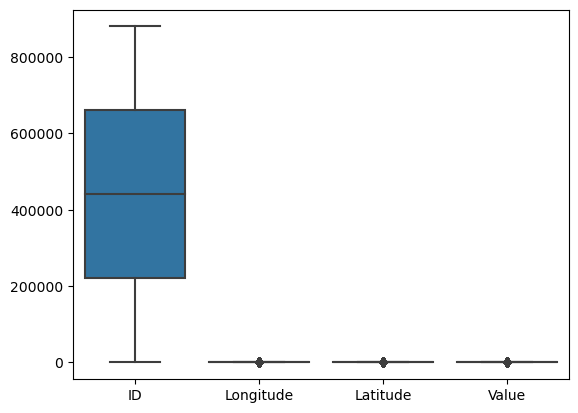

In [16]:
sns.boxplot(combined)

<Axes: >

/opt/conda/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


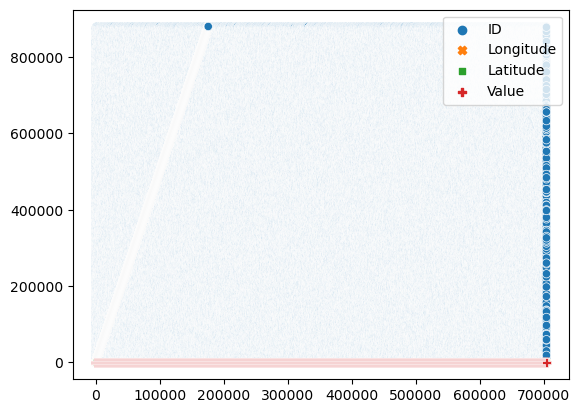

In [17]:
sns.scatterplot(combined)

<Axes: >

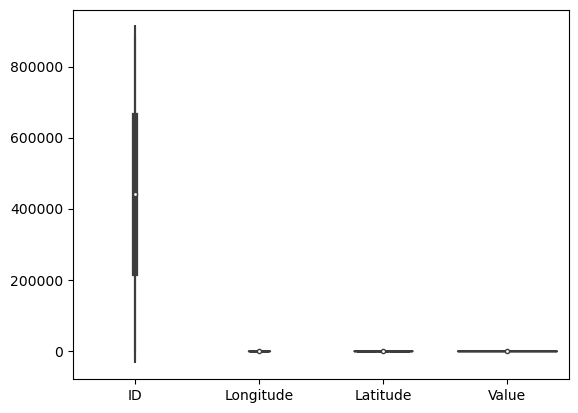

In [18]:
sns.violinplot(combined)


<Axes: >

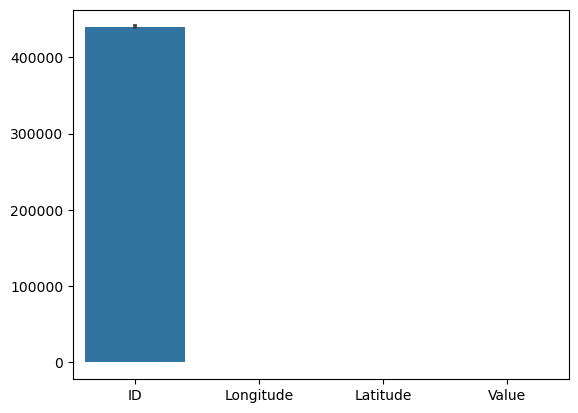

In [19]:
sns.barplot(combined)

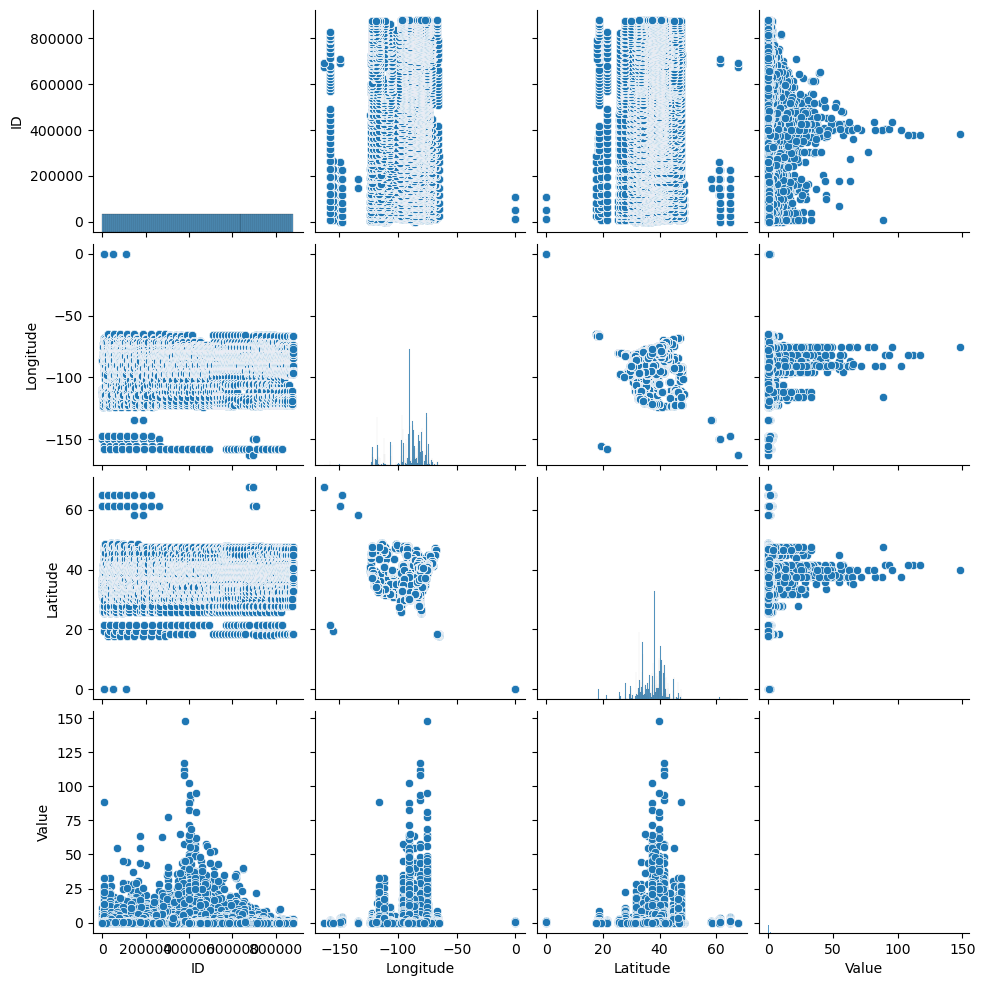

In [5]:
sns.pairplot(combined)

<Axes: >

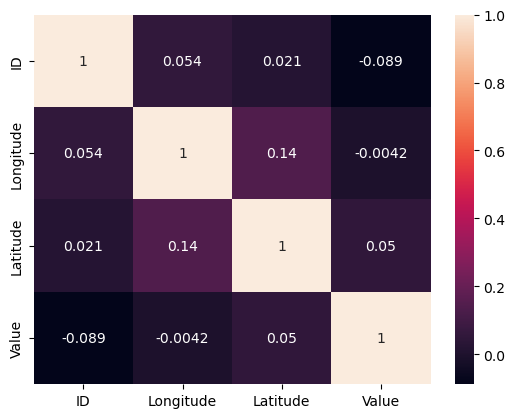

In [23]:
sns.heatmap(combined.corr(),annot=True)

In [10]:
cat_cols = combined.select_dtypes(include='object')

In [11]:
for i in cat_cols:
    print(i)
    print(combined[i].value_counts())
    print('_'*50)

Date
1986-03-21    659
1986-02-01    659
1986-02-13    657
1985-05-01    656
1985-07-12    655
             ... 
2001-12-08      1
1981-11-20      1
2001-07-11      1
2001-04-24      1
2022-08-22      1
Name: Date, Length: 15520, dtype: int64
__________________________________________________


In [12]:
num_cols = combined.select_dtypes(include='number')

In [13]:
for i in num_cols:
    print(i)
    print(combined[i].value_counts())
    print('_'*50)

ID
1         2
117319    2
117311    2
117312    2
117313    2
         ..
351937    1
351936    1
351935    1
351934    1
703883    1
Name: ID, Length: 703883, dtype: int64
__________________________________________________
Longitude
-90.379930     11778
-90.378853      7363
-96.873056      6197
-90.378830      6046
-90.378844      5721
               ...  
-87.065284         1
-84.243533         1
-93.181612         1
-68.771147         1
-107.151407        1
Name: Longitude, Length: 2061, dtype: int64
__________________________________________________
Latitude
38.263510    11778
38.267085     7363
32.778889     6197
38.261792     6059
38.263390     6046
             ...  
44.801738        1
37.640763        1
36.320106        1
35.608128        1
32.667857        1
Name: Latitude, Length: 2064, dtype: int64
__________________________________________________
Value
0.0000    70936
0.0100    40292
0.0300    25237
0.0200    24346
0.0400    21884
          ...  
0.3398        1
0.3996   

In [28]:
combined['ID']=combined['ID'].map({'Good':2,'Standard':1,'Poor':0})

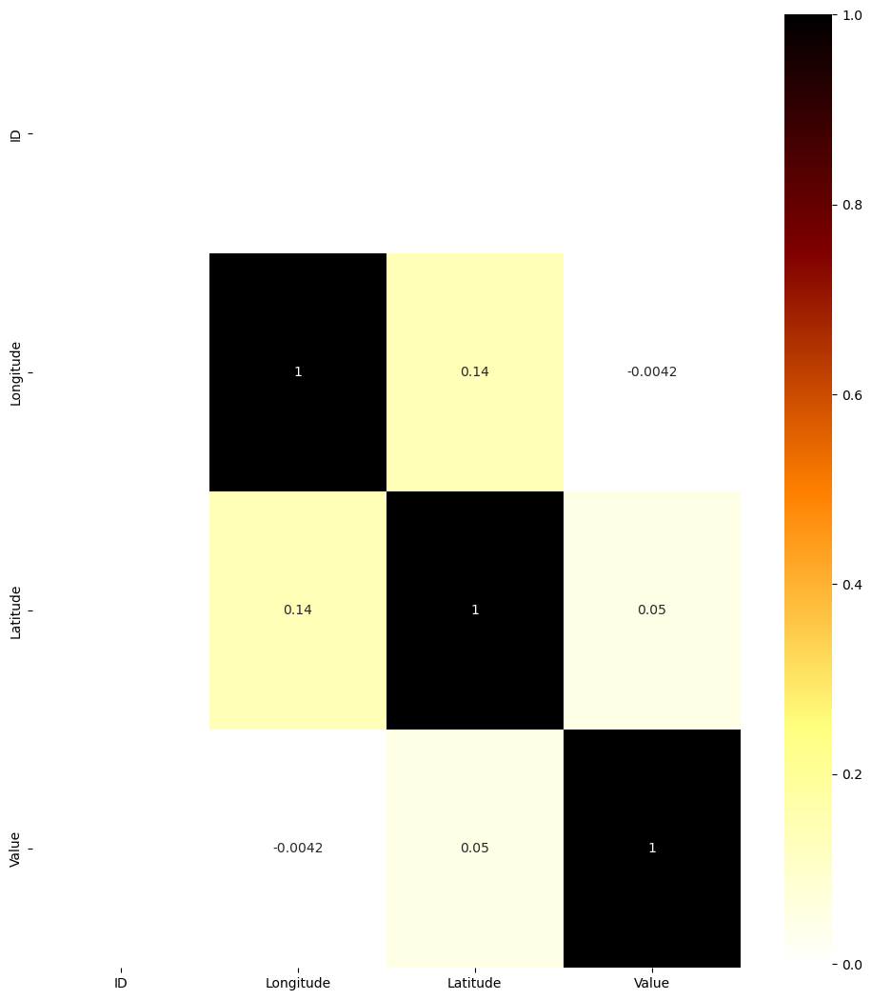

In [29]:
plt.figure(figsize=(12,13))
sns.heatmap(combined.corr(),annot=True,cmap='afmhot_r')
plt.show()

In [30]:
combined['ID'].value_counts()

Series([], Name: ID, dtype: int64)

In [31]:
combined['ID'].unique()

array([nan])

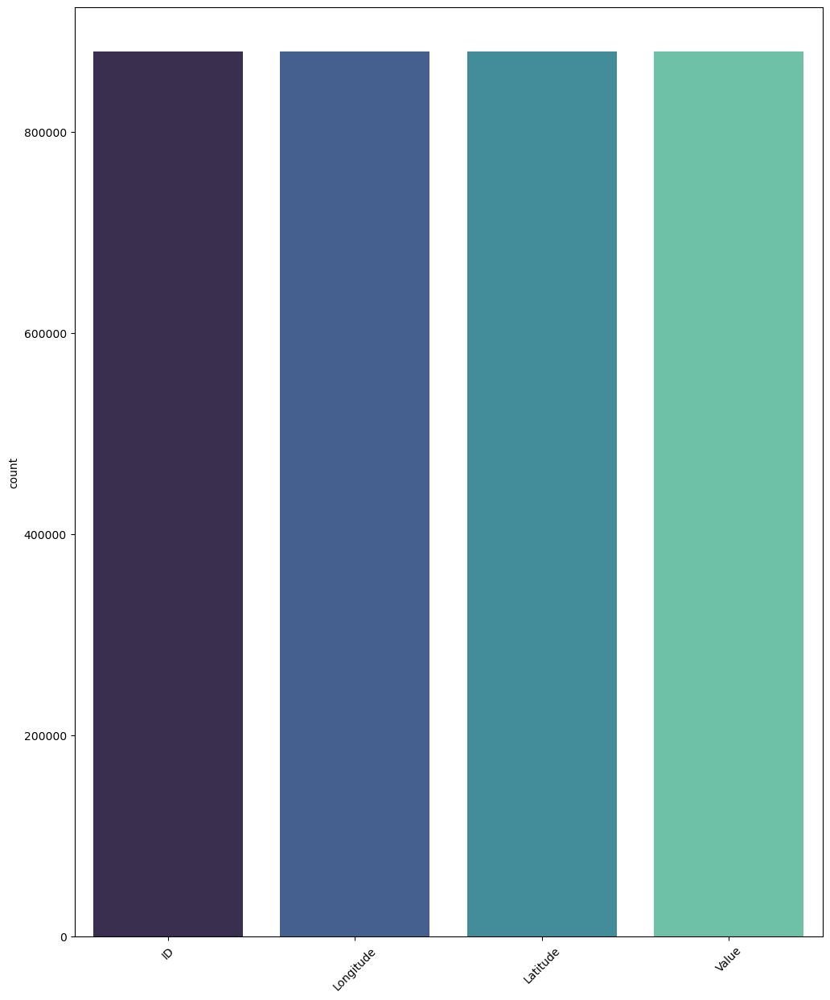

In [32]:
plt.figure(figsize=(12,15))
sns.countplot(combined,palette='mako');
plt.xticks(rotation=45);

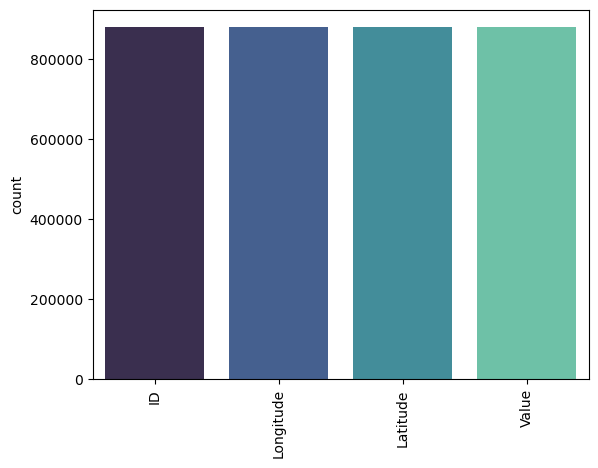

In [33]:
sns.countplot(combined,palette='mako');
plt.xticks(rotation=90);

(array([0, 1, 2, 3]),
 [Text(0, 0, 'ID'),
  Text(1, 0, 'Longitude'),
  Text(2, 0, 'Latitude'),
  Text(3, 0, 'Value')])

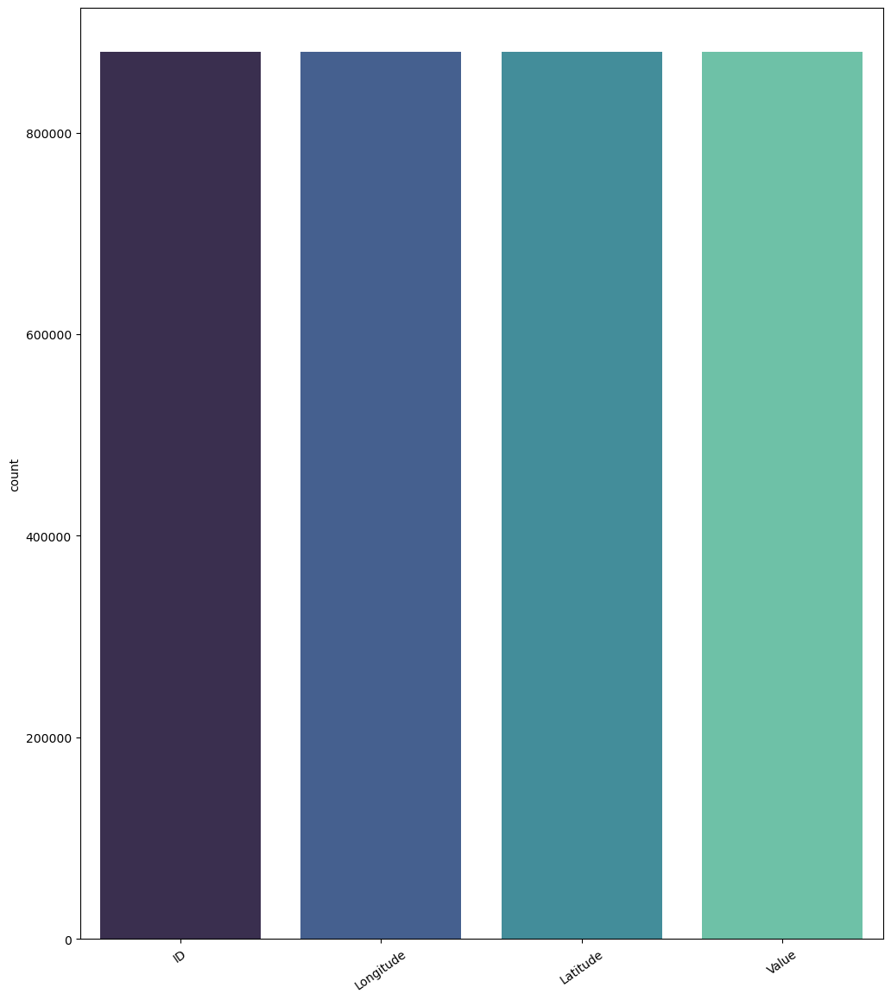

In [34]:
plt.figure(figsize=(12,14))
sns.countplot(combined,palette='mako')
plt.xticks(rotation=35)

In [35]:
# Replacing weird value
combined = combined.applymap(lambda x: x if x is np.NaN or not isinstance(x,str)else str(x).strip('_,"')
                            ).replace(['','nan','!@9#%8','#F%$D@*&8'],np.NaN)

In [36]:
combined.head()

,ID,Longitude,Latitude,Date,Value
0,NaN,-80.279092,40.860031,2016-08-10,0.018
1,NaN,-87.472261,41.596976,1988-05-09,1.678
2,NaN,-95.335833,29.776944,1987-12-11,0.050
3,NaN,-90.373903,38.268254,2007-01-03,0.664
4,NaN,-102.352921,31.872347,1985-10-28,0.060


In [37]:
# Treating type of ID
combined['ID'].value_counts().head(9).index[1:]

Float64Index([], dtype='float64')

In [38]:
# Rebuild type of ID columns
for i in combined['ID'].value_counts().head(9).index[1:]:
    combined[i]=combined['ID'].str.contains(i)

In [39]:
combined.head()

,ID,Longitude,Latitude,Date,Value
0,NaN,-80.279092,40.860031,2016-08-10,0.018
1,NaN,-87.472261,41.596976,1988-05-09,1.678
2,NaN,-95.335833,29.776944,1987-12-11,0.050
3,NaN,-90.373903,38.268254,2007-01-03,0.664
4,NaN,-102.352921,31.872347,1985-10-28,0.060


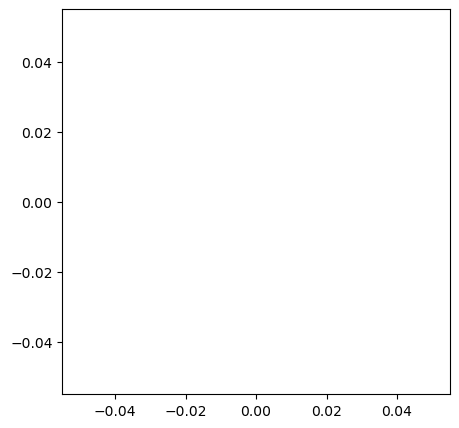

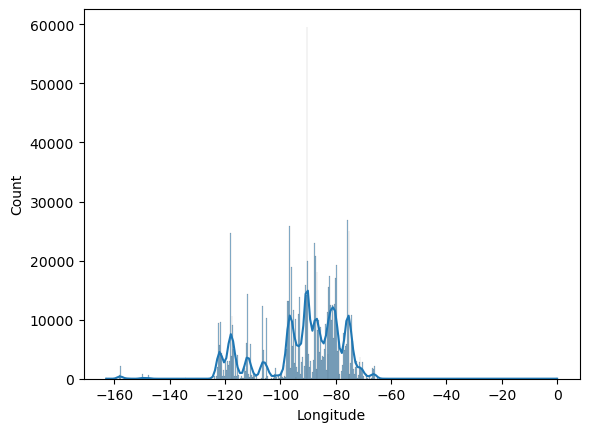

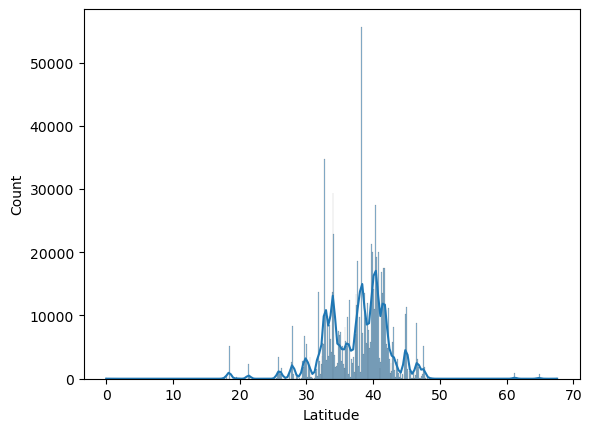

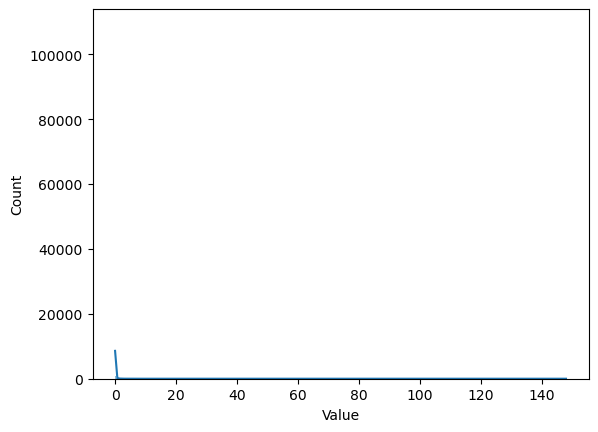

In [40]:
plt.figure(figsize=(5,5))
x=i
for i in num_cols:
    sns.histplot(data=combined,x=i,kde=True)
    print('\n')
    plt.show()

/n


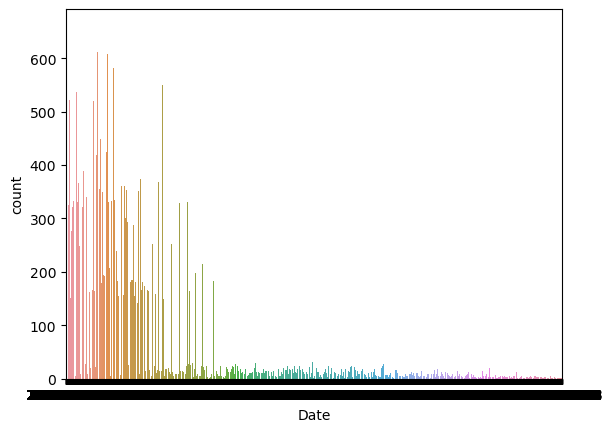

In [42]:
x=i
for i in cat_cols:
    sns.countplot(data=combined,x=i)
    print('/n')
    plt.show()

<Axes: ylabel='Density'>

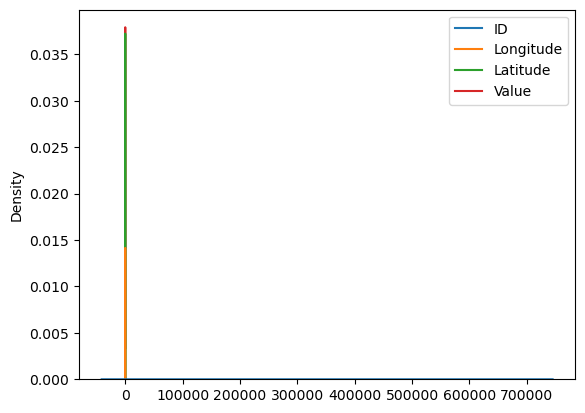

In [8]:

sns.kdeplot(combined)

In [15]:
cat_cols

,Date
0,1984-08-22
1,2000-02-12
2,1995-06-20
3,2012-09-06
4,1986-09-11
...,...
175966,2022-01-23
175967,2022-03-30
175968,2022-04-29
175969,2022-06-04


In [16]:
combined.head()

,ID,Longitude,Latitude,Date,Value
0,1,-87.531711,41.697813,1984-08-22,0.270
1,2,-75.759167,40.476667,2000-02-12,0.030
2,3,-81.036248,34.024497,1995-06-20,0.005
3,4,-95.843642,34.829396,2012-09-06,0.002
4,5,-86.184710,39.775876,1986-09-11,0.117


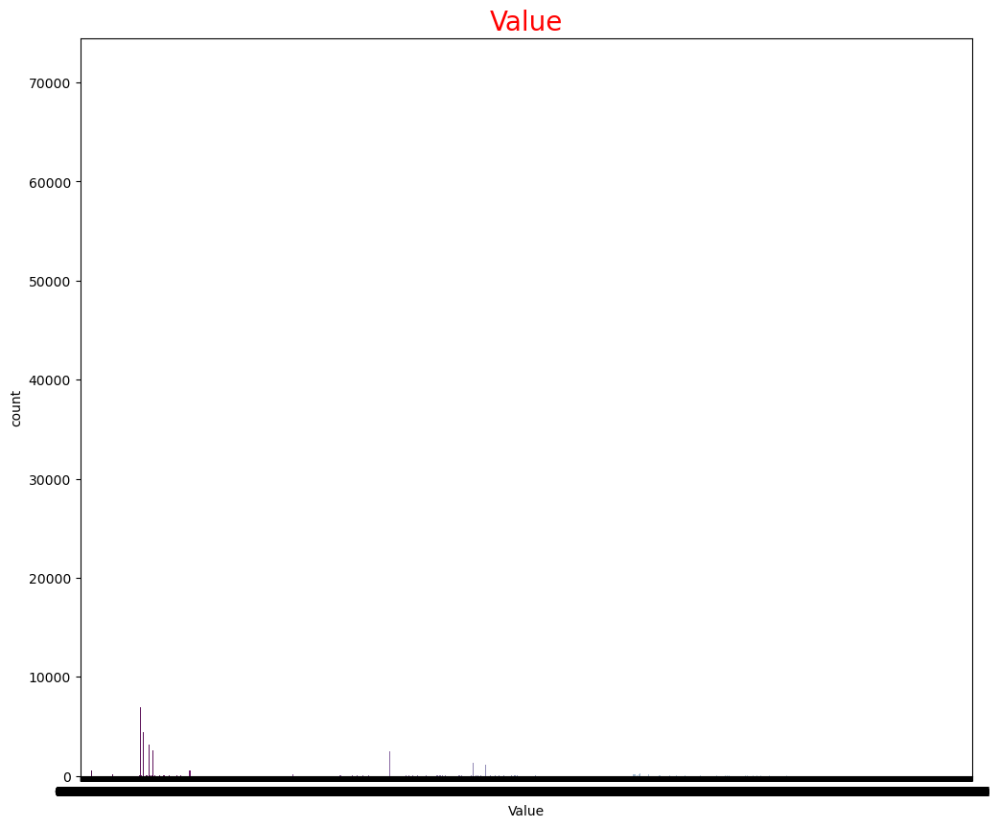

In [20]:
plt.figure(figsize=(12,10))
sns.countplot(data=combined,x='Value',palette='BuPu_r')
plt.title('Value',size=20,color='Red')
plt.show()

In [21]:
combined['Value'].value_counts(normalize=True)*100

0.0000    10.077811
0.0100     5.724247
0.0300     3.585397
0.0200     3.458813
0.0400     3.109039
            ...    
0.3398     0.000142
0.3996     0.000142
3.1560     0.000142
0.2882     0.000142
3.2430     0.000142
Name: Value, Length: 9622, dtype: float64

In [22]:
train.shape[0]

703883

In [11]:
new_train=combined.iloc[0:train.shape[0],:]

In [12]:
new_test=combined.iloc[train.shape[0]:,:]

In [13]:
train.shape,new_train.shape,test.shape,new_test.shape

((703883, 5), (703883, 5), (175971, 4), (175971, 5))

In [14]:
# Scaling the col

In [15]:
scaling=['Value']

In [16]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [17]:
for i in scaling:
    new_train.loc[:,i]=scaler.fit_transform(pd.DataFrame(new_train.loc[:,i]))
    new_test.loc[:,i]=scaler.transform(pd.DataFrame(new_test.loc[:,i]))
    

In [18]:
new_train

,ID,Longitude,Latitude,Date,Value
0,1,-87.531711,41.697813,1984-08-22,0.032943
1,2,-75.759167,40.476667,2000-02-12,-0.185945
2,3,-81.036248,34.024497,1995-06-20,-0.208745
3,4,-95.843642,34.829396,2012-09-06,-0.211481
4,5,-86.184710,39.775876,1986-09-11,-0.106598
...,...,...,...,...,...
703878,703879,-95.998941,36.126945,2011-04-03,-0.207195
703879,703880,-93.298740,45.039720,2006-08-03,-0.213306
703880,703881,-95.220582,29.767997,1987-01-21,-0.076501
703881,703882,-90.690022,37.485387,2002-09-29,0.105906


In [19]:
new_test

,ID,Longitude,Latitude,Date,Value
0,1,-86.585003,34.728831,1980-08-07,NaN
1,2,-86.585003,34.728831,1980-09-24,NaN
2,3,-86.585003,34.728831,1980-10-30,NaN
3,4,-86.585003,34.728831,1980-12-17,NaN
4,5,-85.978974,31.790479,1980-01-10,NaN
...,...,...,...,...,...
175966,175967,-66.694987,18.453389,2022-01-23,NaN
175967,175968,-66.694987,18.453389,2022-03-30,NaN
175968,175969,-66.694987,18.453389,2022-04-29,NaN
175969,175970,-66.694987,18.453389,2022-06-04,NaN


In [20]:
# Encoding

In [21]:
train_encoded=pd.get_dummies(new_train,drop_first=True)

In [22]:
test_encoded=pd.get_dummies(new_test,drop_first=True)

In [23]:
train_encoded

,ID,Longitude,Latitude,Value,Date_1980-01-02,Date_1980-01-03,Date_1980-01-04,Date_1980-01-05,Date_1980-01-06,Date_1980-01-07,Date_1980-01-08,Date_1980-01-09,Date_1980-01-10,Date_1980-01-11,Date_1980-01-12,Date_1980-01-13,Date_1980-01-14,Date_1980-01-15,Date_1980-01-16,Date_1980-01-17,Date_1980-01-18,Date_1980-01-19,Date_1980-01-20,Date_1980-01-21,Date_1980-01-22,Date_1980-01-23,Date_1980-01-24,Date_1980-01-25,Date_1980-01-26,Date_1980-01-27,Date_1980-01-28,Date_1980-01-29,Date_1980-01-30,Date_1980-01-31,Date_1980-02-01,Date_1980-02-02,Date_1980-02-03,Date_1980-02-04,Date_1980-02-05,Date_1980-02-06,Date_1980-02-07,Date_1980-02-08,Date_1980-02-09,Date_1980-02-10,Date_1980-02-11,Date_1980-02-12,Date_1980-02-13,Date_1980-02-14,Date_1980-02-15,Date_1980-02-16,Date_1980-02-17,Date_1980-02-18,Date_1980-02-19,Date_1980-02-20,Date_1980-02-21,Date_1980-02-22,Date_1980-02-23,Date_1980-02-24,Date_1980-02-25,Date_1980-02-26,Date_1980-02-27,Date_1980-02-28,Date_1980-02-29,Date_1980-03-01,Date_1980-03-02,Date_1980-03-03,Date_1980-03-04,Date_1980-03-05,Date_1980-03-06,Date_1980-03-07,Date_1980-03-08,Date_1980-03-09,Date_1980-03-10,Date_1980-03-11,Date_1980-03-12,Date_1980-03-13,Date_1980-03-14,Date_1980-03-15,Date_1980-03-16,Date_1980-03-17,Date_1980-03-18,Date_1980-03-19,Date_1980-03-20,Date_1980-03-21,Date_1980-03-22,Date_1980-03-23,Date_1980-03-24,Date_1980-03-25,Date_1980-03-26,Date_1980-03-27,Date_1980-03-28,Date_1980-03-29,Date_1980-03-30,Date_1980-03-31,Date_1980-04-01,Date_1980-04-02,Date_1980-04-03,Date_1980-04-04,Date_1980-04-05,Date_1980-04-06,Date_1980-04-07,Date_1980-04-08,Date_1980-04-09,Date_1980-04-10,Date_1980-04-11,Date_1980-04-12,Date_1980-04-13,Date_1980-04-14,Date_1980-04-15,Date_1980-04-16,Date_1980-04-17,Date_1980-04-18,Date_1980-04-19,Date_1980-04-20,Date_1980-04-21,Date_1980-04-22,Date_1980-04-23,Date_1980-04-24,Date_1980-04-25,Date_1980-04-26,Date_1980-04-27,Date_1980-04-28,Date_1980-04-29,Date_1980-04-30,Date_1980-05-01,Date_1980-05-02,Date_1980-05-03,Date_1980-05-04,Date_1980-05-05,Date_1980-05-06,Date_1980-05-07,Date_1980-05-08,Date_1980-05-09,Date_1980-05-10,Date_1980-05-11,Date_1980-05-12,Date_1980-05-13,Date_1980-05-14,Date_1980-05-15,Date_1980-05-16,Date_1980-05-17,Date_1980-05-18,Date_1980-05-19,Date_1980-05-20,Date_1980-05-21,Date_1980-05-22,Date_1980-05-23,Date_1980-05-24,Date_1980-05-25,Date_1980-05-26,Date_1980-05-27,Date_1980-05-28,Date_1980-05-29,Date_1980-05-30,Date_1980-05-31,Date_1980-06-01,Date_1980-06-02,Date_1980-06-03,Date_1980-06-04,Date_1980-06-05,Date_1980-06-06,Date_1980-06-07,Date_1980-06-08,Date_1980-06-09,Date_1980-06-10,Date_1980-06-11,Date_1980-06-12,Date_1980-06-13,Date_1980-06-14,Date_1980-06-16,Date_1980-06-17,Date_1980-06-18,Date_1980-06-19,Date_1980-06-20,Date_1980-06-21,Date_1980-06-22,Date_1980-06-23,Date_1980-06-24,Date_1980-06-25,Date_1980-06-26,Date_1980-06-27,Date_1980-06-28,Date_1980-06-29,Date_1980-06-30,Date_1980-07-01,Date_1980-07-02,Date_1980-07-03,Date_1980-07-04,Date_1980-07-05,Date_1980-07-06,Date_1980-07-07,Date_1980-07-08,Date_1980-07-09,Date_1980-07-10,Date_1980-07-11,Date_1980-07-12,Date_1980-07-13,Date_1980-07-14,Date_1980-07-15,Date_1980-07-16,Date_1980-07-17,Date_1980-07-18,Date_1980-07-19,Date_1980-07-20,Date_1980-07-22,Date_1980-07-23,Date_1980-07-24,Date_1980-07-25,Date_1980-07-26,Date_1980-07-28,Date_1980-07-29,Date_1980-07-30,Date_1980-07-31,Date_1980-08-01,Date_1980-08-02,Date_1980-08-03,Date_1980-08-04,Date_1980-08-05,Date_1980-08-06,Date_1980-08-07,Date_1980-08-08,Date_1980-08-09,Date_1980-08-10,Date_1980-08-11,Date_1980-08-12,Date_1980-08-13,Date_1980-08-14,Date_1980-08-15,Date_1980-08-16,Date_1980-08-17,Date_1980-08-18,Date_1980-08-19,Date_1980-08-20,Date_1980-08-21,Date_1980-08-22,Date_1980-08-23,Date_1980-08-24,Date_1980-08-25,Date_1980-08-26,Date_1980-08-27,Date_1980-08-28,Date_1980-08-29,Date_1980-08-30,Date_1980-08-31,Date_1980-09-01,Date_1980-09-02,Date_1980-09-03,Date_1980-09-04,Date_1980-09-05,Date_1980-09-06,Date_1980-09-07,Date_1980-09-08,Dat

In [ ]:
x=train_encoded.drop('Value',axis=1)
y=train_encoded['Value']